In [4]:
import numpy as np
from skimage import data, io, color
import matplotlib.patches as patches
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = (6,3)

# Изображение как массив: начало

В pyhton есть встроенный модель skimage для работы с изображениями. С помощью него, не устанавливая ничего дополнительно, уже можно многое сделать. Ваша задача изучить самостоятельно материал про то, как устроено зрение
[Наш опорный курс по компьютерному зрению](https://courses.cs.washington.edu/courses/cse455/18sp/), посмотрите лекцию по Human vision и восприятию зрения. Если вам не нравится материал этого лектора - можете использовать любой другой. В результате у вас должна появиться заметка в маркдауне (используйте картинки с прямыми ссылками или загружайте их к себе в репозиторий и оттуда подгружайте потом). Эту заметку вы добавляете к себе на сайт к следующему занятию, а также отправляете в гугл класс. Также надо доделать эту тетрадку и тоже отправить ее на проверку


In [5]:
print("Доступные изображения в skimage \n")
'; '.join(data.__all__[2:])

Доступные изображения в skimage 



'astronaut; binary_blobs; brick; camera; cell; checkerboard; chelsea; clock; coffee; coins; colorwheel; grass; gravel; horse; hubble_deep_field; immunohistochemistry; lbp_frontal_face_cascade_filename; lfw_subset; logo; microaneurysms; moon; page; text; retina; rocket; rough_wall; shepp_logan_phantom; stereo_motorcycle'

## Как прочитать изображение?
Во многих пакетах есть средства работы с изображениям, посмотрим встроенные
 - средствами matplotlib.image (используется Pillow (PIL))
 - skiimage
 
Есть разница откуда читать изображение, если оно находится по ссылке, то напрямую PIL не будет работать, skimage умеет читать прямо из ссылки  

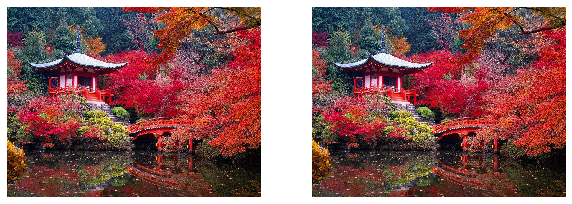

In [6]:
# если на диске
fig, ax = plt.subplots(ncols = 2, figsize = (10,8))
ax[0].imshow(io.imread('imgs/Kyoto.jpg'));ax[0].axis('off');
ax[1].imshow(mpimg.imread('imgs/Kyoto.jpg')); ax[1].axis('off');

In [7]:
import requests
from io import BytesIO
from PIL import Image

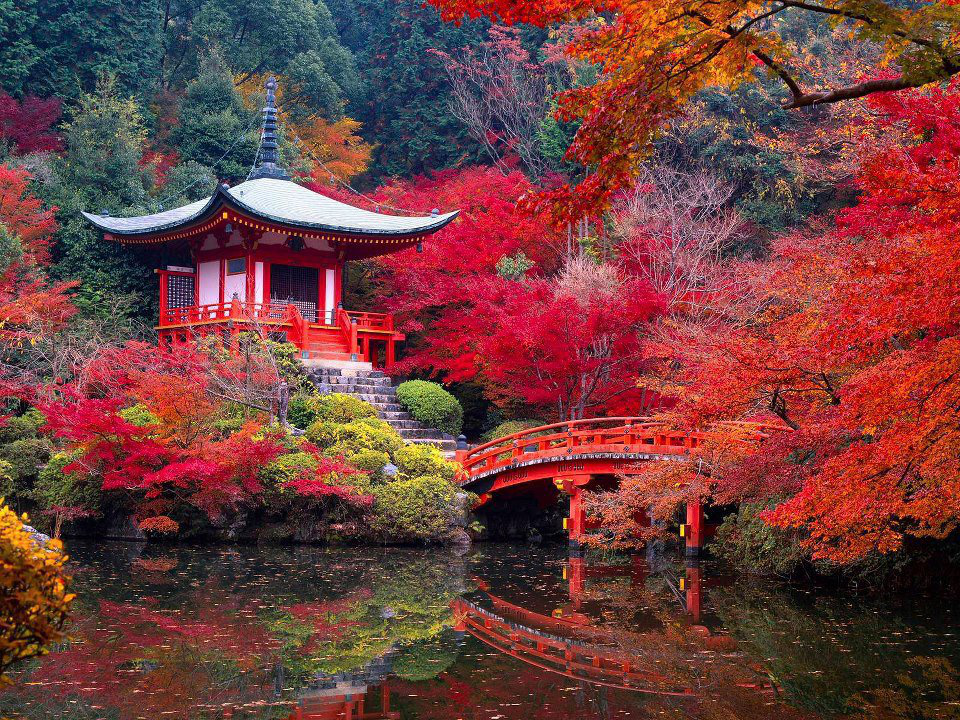

In [8]:
Image.open('imgs/Kyoto.jpg')

А если хотим прочитать сразу из урла - не получится, то skimage справится, а PIL  - нет

ValueError: invalid PNG header

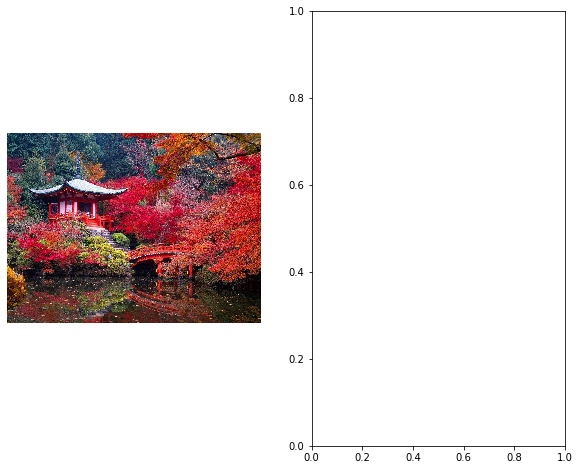

In [9]:
im_link = 'https://images.squarespace-cdn.com/content/v1/55ee34aae4b0bf70212ada4c/1479762511721-P1Z10B8ZJDWMPJO9C9TY/ke17ZwdGBToddI8pDm48kPmLlvCIXgndBxNq9fzeZb1Zw-zPPgdn4jUwVcJE1ZvWQUxwkmyExglNqGp0IvTJZamWLI2zvYWH8K3-s_4yszcp2ryTI0HqTOaaUohrI8PIFMLRh9LbupWL4Bv1SDYZc4lRApws2Snwk0j_RSxbNHMKMshLAGzx4R3EDFOm1kBS/Kyoto+3.jpg'
fig, ax = plt.subplots(ncols = 2, figsize = (10,8))
ax[0].imshow(io.imread(im_link));ax[0].axis('off');
ax[1].imshow(mpimg.imread(im_link)); ax[1].axis('off');

In [10]:
Image.open(im_link)

FileNotFoundError: [Errno 2] No such file or directory: 'https://images.squarespace-cdn.com/content/v1/55ee34aae4b0bf70212ada4c/1479762511721-P1Z10B8ZJDWMPJO9C9TY/ke17ZwdGBToddI8pDm48kPmLlvCIXgndBxNq9fzeZb1Zw-zPPgdn4jUwVcJE1ZvWQUxwkmyExglNqGp0IvTJZamWLI2zvYWH8K3-s_4yszcp2ryTI0HqTOaaUohrI8PIFMLRh9LbupWL4Bv1SDYZc4lRApws2Snwk0j_RSxbNHMKMshLAGzx4R3EDFOm1kBS/Kyoto+3.jpg'

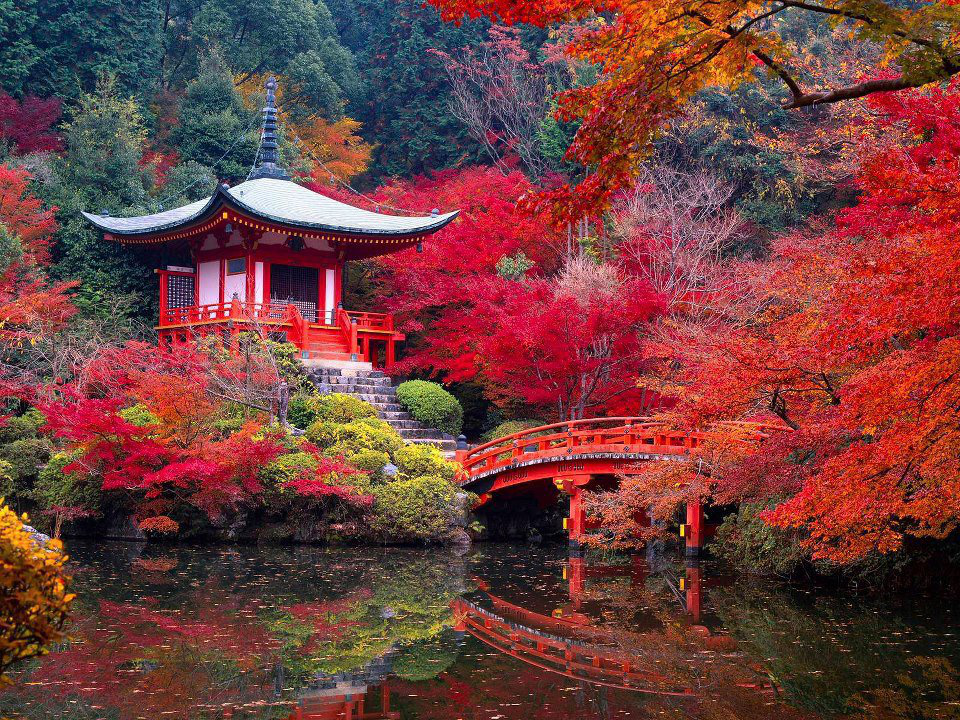

In [11]:
response = requests.get(im_link)
rdata = BytesIO(response.content)
Image.open(rdata)

In [13]:
kyoto = np.array(Image.open(rdata))

Эта картинка будет вашим заданием, а потренируемся на кошечках, еще и встроенных

## Изображение как матрица
Изображение - массив в numpy, можем использовать любые пиксельные трансформации. Как устроен массив чуть попозже, а пока научимся накладывать различные маски

Image dimensions: (300, 451, 3)
Image size: 405900


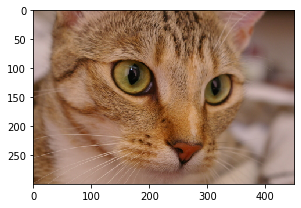

In [14]:
#считываем картинку
image = data.chelsea()
#показываем
io.imshow(image);
print('Image dimensions:', image.shape)
print('Image size:', image.size)

In [15]:
from skimage.draw import ellipse

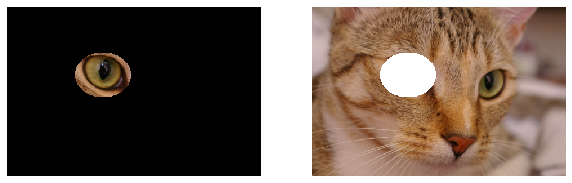

In [17]:
rr, cc = ellipse(120, 170, 40, 50, image.shape)
img = image.copy()
mask = np.zeros_like(img)
mask[rr,cc] = 1
fig, ax = plt.subplots(ncols = 2, figsize = (10,8))
img[mask==0] = 1
ax[0].imshow(img); ax[0].axis('off');
img = image.copy()
img[mask==1] = 255
ax[1].imshow(img); ax[1].axis('off');

## Задание 1. Bounding box
Очень часто какой-то объект (лицо например) выделяют с помощью бокса
возьмите любую картинку, выделите бокс, и рядом отрисуйте содержимое бокса

## Playing with colors

Цветовые схемы, вы с ними еще познакомитесь. А мы пока посмотрим что с этим можно сделать
Обычно цветное изображение загружается в RGB схеме. То есть изображение это три сконкатенированные матрицы:  {Red, Green, Blue} 

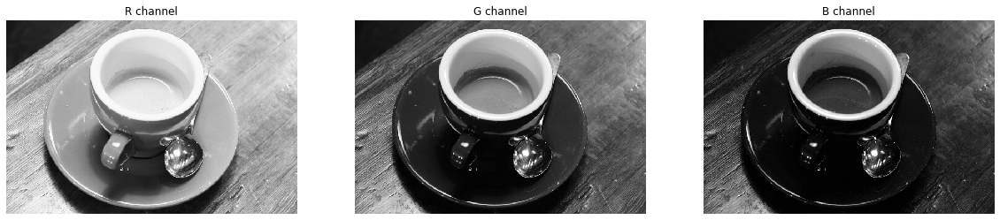

In [18]:
image = data.coffee()
f, ax = plt.subplots(1, 3, figsize=(20,10))
chans = ['R','G','B']
for i in range(3):
    ax[i].set_title(chans[i]+' channel')
    ax[i].imshow(image[:,:,i], cmap='gray')
    ax[i].axis('off')


Как получить из цветной картинки изображение в градациях серого? А можно обратно?
В skimage есть конвертеры skimage.color. Что-то произошло в ячейке ниже. Что я хотела сказать этим примером?

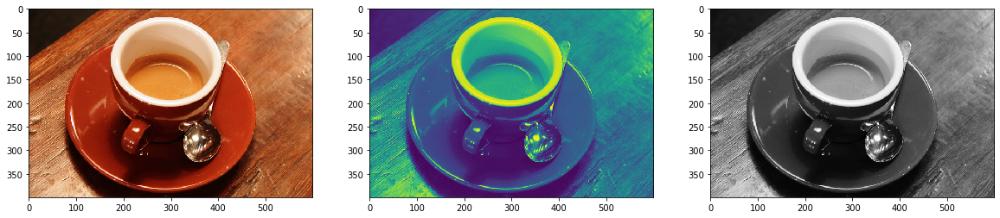

In [19]:
grayscale = color.rgb2gray(image)
rgb = color.gray2rgb(grayscale)
fig, ax = plt.subplots(1,3, figsize = (20,10))
ax[0].imshow(image);ax[1].imshow(grayscale);ax[2].imshow(rgb);

## RGB to HUE

Хороший инструмент посмотреть как соответсвтуют карты
http://math.hws.edu/graphicsbook/demos/c2/rgb-hsv.html

In [20]:
from skimage.color import rgb2hsv, hsv2rgb

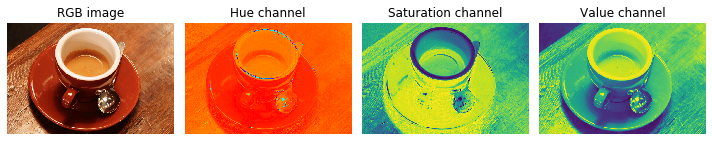

In [21]:
rgb_img = data.coffee()
hsv_img = rgb2hsv(rgb_img)
hue_img = hsv_img[:, :, 0]
sat_img = hsv_img[:, :, 1]
value_img = hsv_img[:, :, 2]

fig, ax = plt.subplots(ncols=4, figsize=(10, 4))

titles = ["RGB image","Hue channel","Saturation channel", "Value channel"]
imgs = [rgb_img, hue_img,sat_img,value_img]
cmaps = [None,'hsv', None,None]
for i in range(4):
    ax[i].imshow(imgs[i], cmap = cmaps[i])
    ax[i].set_title(titles[i])
    ax[i].axis('off')

fig.tight_layout()

In [22]:
data.camera().shape

(512, 512)

Допустим у вас есть любимый цвет и вы хотите видеть все в нем, тогда для этого отлично подходит hsv цветовая схема.
Посмотрим как наше кофе будет выглятедь в разных цветах

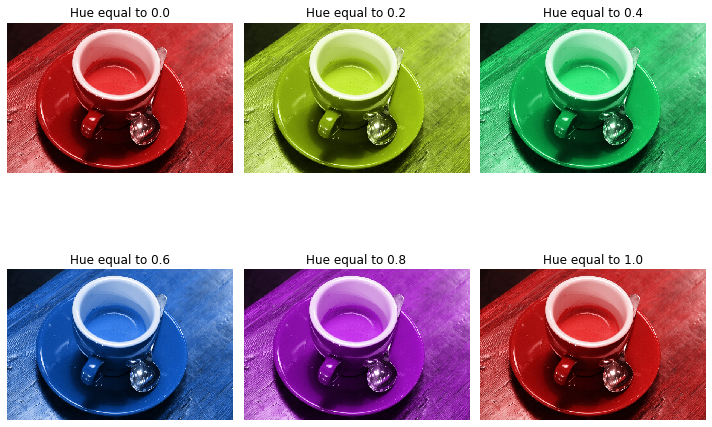

In [23]:
def colorize(image, hue):
    hsv = color.rgb2hsv(color.gray2rgb(image))
    hsv[:, :, 0] = hue
    return color.hsv2rgb(hsv)


image = data.coffee()

hue_rotations = np.linspace(0, 1, 6)  
colorful_images = [colorize(image, hue) for hue in hue_rotations]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize = (10,8))

for ax, array, hue in zip(axes.flat, colorful_images,hue_rotations):
    ax.imshow(array, vmin=0, vmax=1)
    ax.set_title(f'Hue equal to {round(hue,3)}')
    ax.set_axis_off()

fig.tight_layout()

### Сохранение изображения 
тут все просто:

`io.imsave(filename, source)`

Но если вы посмотрите на внтуреннее представление, то там каждый слой переведен в масштаб от 0 до 1, а стандартное представление это диапазон 0-255, поэтому вы переводите либо руками, либо оставляете это функции, она тогда выдаст предупреждение

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


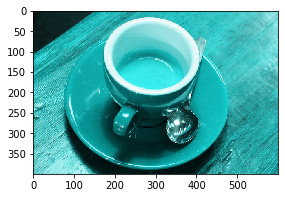

In [25]:
plt.imshow(colorize(image, 0.5))
io.imsave('imgs/blue_coffee.png', colorize(image, 0.5))
io.imsave('imgs/blue_coffee.png', (255*colorize(image, 0.5)).astype(np.uint8))

## А как быть если захотелось не только базового цвета, но еще и  оттенков?

Сделайте модификацию функции colorize,  в которой можно задать диапазон базового цвета  hue_min, hue_max

In [26]:
def colorize_band(image, hue_min,hue_max):
    #to do
    pass
    

Все оттенки фиолетового у вас будут выглядеть как-то так

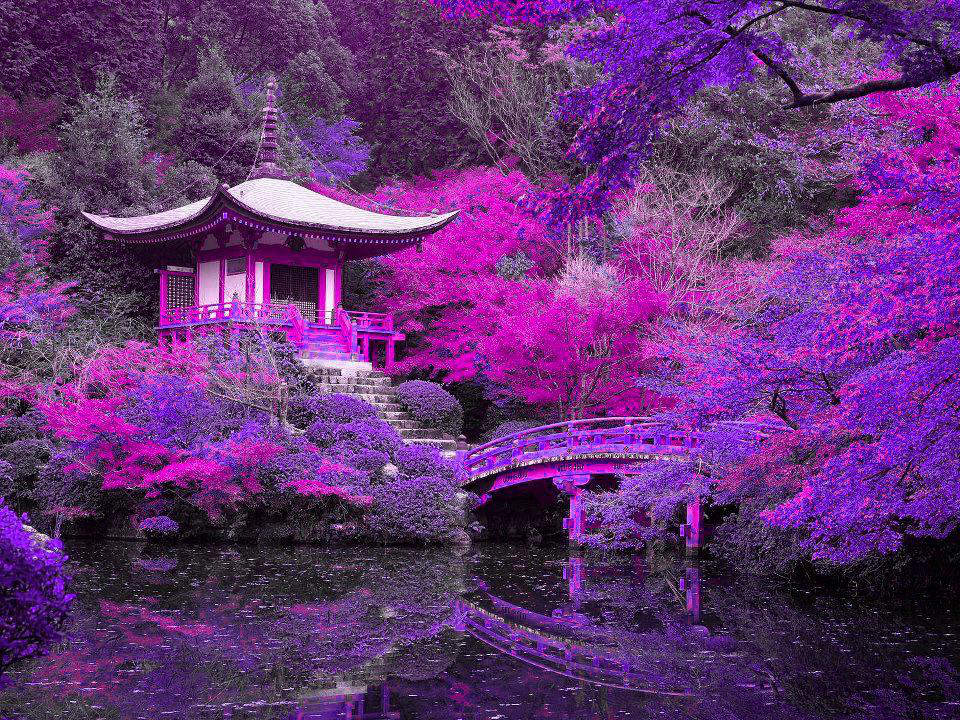

In [27]:
Image.open('imgs/purple_kyoto.jpg')